1. Importing required libraries

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import pandas as pd
from pathlib import Path
import os.path
from PIL import Image
import torchvision.transforms as T
!pip install split-folders
import splitfolders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


2. Connecting to Drive


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
input_folder = "/content/drive/MyDrive/APS360_dataset"
output_folder = "/content/drive/MyDrive/APS360_dataset_split"

# split data into training, validation, and testing (.6/.2/.2)
splitfolders.ratio(input_folder, output=output_folder, seed=1, ratio=(.6,.2,.2), group_prefix=None)

Copying files: 14534 files [04:17, 56.36 files/s] 


31 classes

In [ ]:
def data_loader(data, test = False, batch_size = 64, shuffle = True):
  # transform to tensor
  transform = transforms.Compose([transforms.Resize((224, 224)), transforms.ToTensor()])

  # get train, val, test
  train_data = torchvision.datasets.ImageFolder(data + "/train", transform = transform)
  val_data = torchvision.datasets.ImageFolder(data + "/val", transform = transform)

  # get test only if test == True
  if test == True:
    test_data = torchvision.datasets.ImageFolder(data + "/test", transform = transform)

  # load data
  train_loader = torch.utils.data.DataLoader(train_data, batch_size = batch_size, shuffle = shuffle)
  val_loader = torch.utils.data.DataLoader(val_data, batch_size = batch_size, shuffle = shuffle)
  if test == True:
    test_loader = torch.utils.data.DataLoader(test_data, batch_size = batch_size, shuffle = shuffle)
  else:
    test_loader = None

  return train_loader, val_loader, test_loader

train_loader, val_loader, test_loader = data_loader("/content/drive/MyDrive/APS360_dataset_split", test = True, batch_size = 1)

# check number of images
print("Training images:",len(train_loader))
print("Validation images:",len(val_loader))
print("Testing images:",len(test_loader))

Training images: 8716
Validation images: 2901
Testing images: 2917


In [ ]:
`from torchvision.models import resnet34, ResNet34_Weights

resnet34(weights=ResNet34_Weights.IMAGENET1K_V1)


weights = ResNet34_Weights.DEFAULT

model = torchvision.models.resnet34(pretrained=True)

for param in model.parameters():
    param.requires_grad = False

model.fc = nn.Sequential(
               nn.Linear(512, 256),
               nn.ReLU(inplace=True),
               nn.Linear(256, 31))

model.eval()

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
!nvidia-smi

Wed Nov 30 02:25:12 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
use_cuda = True
import time

In [ ]:
def get_accuracy(model, loader):

  correct = 0
  total = 0
  for images, labels in loader:        
      if use_cuda and torch.cuda.is_available():
        images = images.cuda()
        labels = labels.cuda()
      
      output = model(images)

      #select index with maximum prediction score
      pred = output.max(1, keepdim=True)[1]
      correct += pred.eq(labels.view_as(pred)).sum().item()
      total += images.shape[0]

  return correct / total

  
def train_model(model, data, test = False, batch_size = 50, num_epochs = 30, learning_rate = 0.001):
  """
  train a CNN model to classify different hand gestures
  """
  # dataloader
  train_loader, val_loader, test_loader = data_loader(data, test, batch_size)

  # define seed so that results are reproduced
  torch.manual_seed(1)

  criterion = nn.CrossEntropyLoss()
  optimizer = optim.Adam(model.parameters(), lr = learning_rate)

  # set up lists to store iteration,losses, and training and validation accuracy values
  ep, iters, losses, train_acc, val_acc = [], [], [], [], []

  # train model
  print("starting training")
  start = time.time()
  n = 0
  e = 0
  iterno = 0
  for epoch in range(num_epochs): 
    print("Epoch: " + str(epoch + 1))
    for images, labels in iter(train_loader):
      if use_cuda and torch.cuda.is_available():
        images = images.cuda()
        labels = labels.cuda()
      output = model(images)
      loss = criterion(output, labels)
      loss.backward()
      optimizer.step()
      optimizer.zero_grad()
      # save the current training information
      iters.append(n)
      # compute *average* loss
      losses.append(float(loss)/batch_size)
      n += 1  
      iterno += 1
    # compute training accuracy           
    train_acc.append(get_accuracy(model, train_loader)) 
    # compute validation accuracy
    val_acc.append(get_accuracy(model, val_loader))  
    e +=1
    ep.append(e)

    # get current accuracy
    print("Current training accuracy:", train_acc[-1])
    print("Current validation accuracy:", val_acc[-1])

  end = time.time()
  print("elapsed time: " + str(end - start))
  # plotting
  plt.title("Training Curve")
  plt.plot(iters, losses, label="Train")
  plt.xlabel("Iterations")
  plt.ylabel("Loss")
  plt.show()

  plt.title("Training Curve")
  plt.plot(ep, train_acc, label="Train")
  plt.plot(ep, val_acc, label="Validation")
  plt.xlabel("Iterations")
  plt.ylabel("Training Accuracy")
  plt.legend(loc='best')
  plt.show()

  print("Training Accuracy:", train_acc[-1])
  print("Validation Accuracy:", val_acc[-1])

In [ ]:
train_path = Path('../content/drive/MyDrive/APS360_dataset_split/train')
val_path = Path('../content/drive/MyDrive/APS360_dataset_split/val')
test_path = Path('../content/drive/MyDrive/APS360_dataset_split/test')

# resizing the image to 224x224 and to tensors
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# creating datasets
train_dataset = torchvision.datasets.ImageFolder(root = train_path, transform = transform)
val_dataset = torchvision.datasets.ImageFolder(root = val_path, transform = transform)
test_dataset = torchvision.datasets.ImageFolder(root = test_path, transform = transform)

print(len(train_dataset), len(test_dataset))

8716 2917


seong joo: 

batch size 256, epochs 10, lr 0.001

batch size 256, epochs 10, lr 0.003

batch size 256, epochs 15, lr 


kevin: 

batch size 512, epochs 10, lr 0.001

batch size 512, epochs 10, lr 0.003

batch size 512, epochs 15, lr 

In [ ]:
if use_cuda and torch.cuda.is_available():
  model.cuda()
  print('CUDA is available!  Training on GPU ...')
else:
  print('CUDA is not available.  Training on CPU ...')

CUDA is available!  Training on GPU ...


starting training
Epoch: 1


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


Current training accuracy: 0.768012849931161
Current validation accuracy: 0.7576697690451568
Epoch: 2
Current training accuracy: 0.8259522716842589
Current validation accuracy: 0.8066184074457083
Epoch: 3
Current training accuracy: 0.8744837081229923
Current validation accuracy: 0.8459152016546019
Epoch: 4
Current training accuracy: 0.9007572280862781
Current validation accuracy: 0.860392967942089
Epoch: 5
Current training accuracy: 0.8494722349701698
Current validation accuracy: 0.8107549120992761
Epoch: 6
Current training accuracy: 0.874942634235888
Current validation accuracy: 0.8386763185108583
Epoch: 7
Current training accuracy: 0.8949059201468563
Current validation accuracy: 0.8607376766632195
Epoch: 8
Current training accuracy: 0.9159017898118403
Current validation accuracy: 0.8665977249224406
Epoch: 9
Current training accuracy: 0.9180816888480955
Current validation accuracy: 0.864184763874526
Epoch: 10
Current training accuracy: 0.9224414869206058
Current validation accuracy: 0

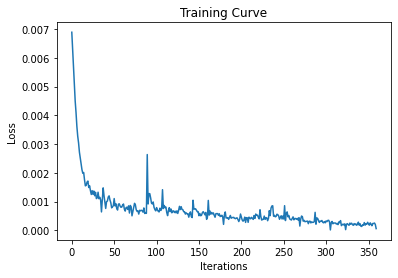

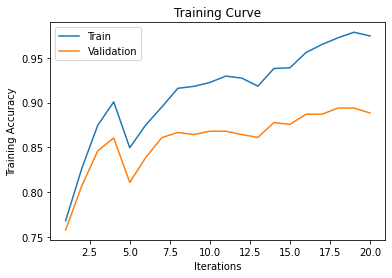

Training Accuracy: 0.9744148692060578
Validation Accuracy: 0.8883143743536711


In [ ]:
train_model(model, "/content/drive/MyDrive/APS360_dataset_split", batch_size = 512, num_epochs = 20, learning_rate = 0.003)

In [ ]:
train_loader, val_loader, test_loader = data_loader('../content/drive/MyDrive/APS360_dataset_split', test = True)
test_acc = get_accuracy(model, test_loader)
print(test_acc)

KeyboardInterrupt: ignored

In [ ]:
model

In [ ]:
classes = ['apple', 'asparagus', 'avocado', 'banana', 'bean', 'beetroot', 'bell pepper', 'bread',
           'broccoli', 'butter', 'cabbage', 'carrot', 'cauliflower', 'cucumber', 'grapes', 'lemon',
           'lettuce', 'meatloaf', 'onion', 'potato', 'pumpkin', 'radish', 'raw_beef', 'raw_chicken',
           'raw_pork', 'red_wine', 'salmon', 'spinach', 'sweet_potato', 'tomato', 'zucchini']

In [ ]:
from PIL import Image

In [ ]:
my_img = Image.open("/content/apple_test.JPG").convert('RGB').rotate(angle=270)

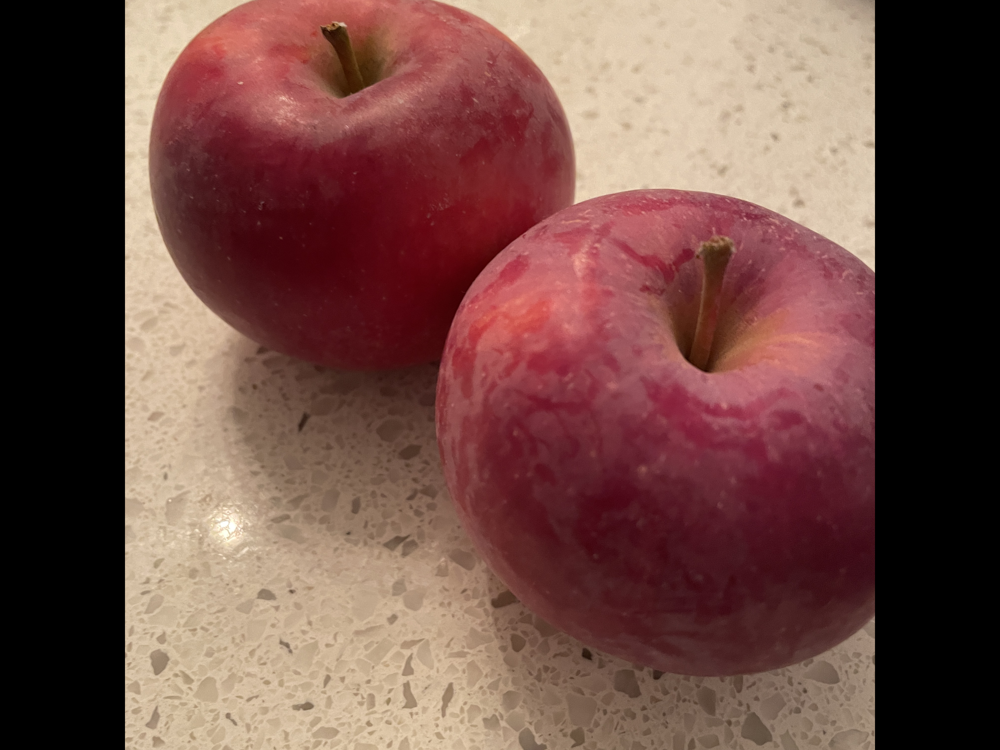

In [ ]:
my_img

In [ ]:
transform = transforms.Compose([transforms.Resize((224, 224)), transforms.ToTensor()])
my_img_proc = transform(my_img)
my_img_proc_final = torch.unsqueeze(my_img_proc, 0)
model.eval()
out = model(my_img_proc_final.cuda())

In [ ]:
classes[torch.argmax(out)]

'red_wine'

In [ ]:
# resizing the image to 224x224 and to tensors
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

In [ ]:
2# creating datasets
train_dataset = torchvision.datasets.ImageFolder(root = train_path, transform = transform)
test_dataset = torchvision.datasets.ImageFolder(root = test_path, transform = transform)

print(len(train_dataset), len(test_dataset))

FileNotFoundError: ignored

There are 3123 train samples and 359 test samples. There are a total of 36 classes.

In [ ]:
from torch.utils.data.dataloader import DataLoader
train_loader = DataLoader(
    train_dataset,
    batch_size=50,
    shuffle=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=50,
    shuffle=True
)

In [ ]:
train_dataset[0][0].shape

Visualizing Data (used code from Lab 2):

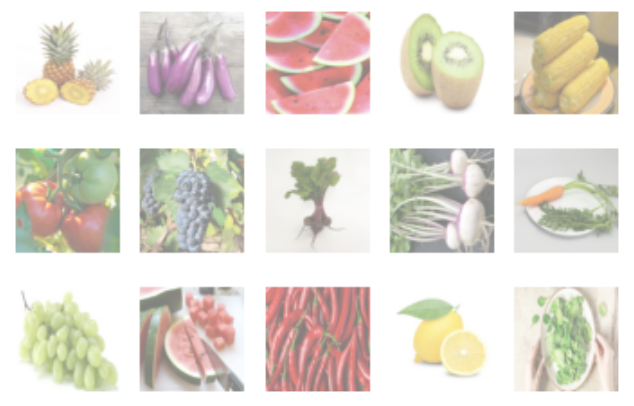

Now to get the dataset and reshape the image sizes; we note the image sizes are all different (see code below)

Defining the base model (LeNet-5)

added the implementation of le net 5, need to fit data to use it


In [ ]:
class LeNet(nn.Module):
    def __init__(self, output_dim):
        super().__init__()

        self.conv1 = nn.Conv2d(in_channels=1,
                               out_channels=6,
                               kernel_size=5)

        self.conv2 = nn.Conv2d(in_channels=6,
                               out_channels=16,
                               kernel_size=5)

        self.fc_1 = nn.Linear(16 * 4 * 4, 120)
        self.fc_2 = nn.Linear(120, 84)
        self.fc_3 = nn.Linear(84, output_dim)

    def forward(self, x):

        # x = [batch size, 1, 28, 28]

        x = self.conv1(x)

        # x = [batch size, 6, 24, 24]

        x = F.max_pool2d(x, kernel_size=2)

        # x = [batch size, 6, 12, 12]

        x = F.relu(x)

        x = self.conv2(x)

        # x = [batch size, 16, 8, 8]

        x = F.max_pool2d(x, kernel_size=2)

        # x = [batch size, 16, 4, 4]

        x = F.relu(x)

        x = x.view(x.shape[0], -1)

        # x = [batch size, 16*4*4 = 256]

        h = x

        x = self.fc_1(x)

        # x = [batch size, 120]

        x = F.relu(x)

        x = self.fc_2(x)

        # x = batch size, 84]

        x = F.relu(x)

        x = self.fc_3(x)

        # x = [batch size, output dim]

        return x, h

In [ ]:
def data_loader(data, test = False, batch_size = 50, shuffle = True):
  """
  load images of hand gestures from dataset
  """
  # transform to tensor
  transform = transforms.Compose([transforms.Resize((224, 224)), transforms.ToTensor()])

  # get train, val, test
  train_data = torchvision.datasets.ImageFolder(data + "/train", transform = transform)
  val_data = torchvision.datasets.ImageFolder(data + "/validation", transform = transform)

  # get test only if test == True
  if test == True:
    test_data = torchvision.datasets.ImageFolder(data + "/test", transform = transform)

  # load data
  train_loader = torch.utils.data.DataLoader(train_data, batch_size, shuffle = shuffle)
  val_loader = torch.utils.data.DataLoader(val_data, batch_size, shuffle = shuffle)
  if test == True:
    test_loader = torch.utils.data.DataLoader(test_data, batch_size = batch_size, shuffle = shuffle)
  else:
    test_loader = None

  return train_loader, val_loader, test_loader

train_loader, val_loader, test_loader = data_loader('../content/drive/MyDrive/APS360_Project_Data_Test', test = True, batch_size = 50)

# check number of images
print("Training images:",len(train_loader))
print("Validation images:",len(val_loader))
print("Testing images:",len(test_loader))

In [ ]:
class GestureClassifier(nn.Module):
  def __init__(self):
    super(GestureClassifier, self).__init__()
    self.name = "gc"
    # input = 224 x 224 x 3
    # kernel 1: size = 5 x 5, filters = 5
    # output = 220 x 220 x 5
    self.conv1 = nn.Conv2d(3, 5, 5)

    # input = 220 x 220 x 5
    # maxpool: size = 2, stride = 2
    # output = 110 x 110 x 5
    self.pool = nn.MaxPool2d(2,2)

    # input = 110 x 110 x 5
    # kernel 2: size = 3 x 3, filters = 20
    # output = 108 x 108 x 20
    self.conv2 = nn.Conv2d(5, 20, 3)

    # max pooling 2
    # output: 54 x 54 x 20

    # fc layers
    # layer 1
    self.fc1 = nn.Linear(54 * 54 * 20, 54 * 10)

    # layer 2
    self.fc2 = nn.Linear(54 * 10, 250)

    # layer 3
    # 9 outputs
    self.fc3 = nn.Linear(250, 36)
  
  def forward(self, x):
    
    x = self.pool(F.relu(self.conv1(x)))
    x = self.pool(F.relu(self.conv2(x)))

    x = x.view(-1, 20 * 54 * 54)
    x = F.relu(self.fc1(x))
    x = F.relu(self.fc2(x))
    x = self.fc3(x)

    return x


In [ ]:
def get_accuracy(model, loader):

  correct = 0
  total = 0
  for images, labels in loader:        
      output = model(images)
        
      #select index with maximum prediction score
      pred = output.max(1, keepdim=True)[1]
      correct += pred.eq(labels.view_as(pred)).sum().item()
      total += images.shape[0]

  return correct / total

  
def train_model(model, data, test = False, batch_size = 50, num_epochs = 30, learning_rate = 0.001):
  """
  train a CNN model to classify different hand gestures
  """
  # dataloader
  train_loader, val_loader, test_loader = data_loader(data, test, batch_size)

  # define seed so that results are reproduced
  torch.manual_seed(1)

  criterion = nn.CrossEntropyLoss()
  optimizer = optim.Adam(model.parameters(), lr = learning_rate)

  # set up lists to store iteration,losses, and training and validation accuracy values
  ep, iters, losses, train_acc, val_acc = [], [], [], [], []

  # train model
  print("starting training")
  n = 0
  e = 0
  for epoch in range(num_epochs): 
    print(epoch)
    for images, labels in iter(train_loader):
      print("h")
      output = model(images)
      loss = criterion(output, labels)
      loss.backward()
      optimizer.step()
      optimizer.zero_grad()

      # save the current training information
      iters.append(n)
      # compute *average* loss
      losses.append(float(loss)/batch_size)
      n += 1  
    # compute training accuracy           
    train_acc.append(get_accuracy(model, train_loader)) 
    # compute validation accuracy
    val_acc.append(get_accuracy(model, val_loader))  
    e +=1
    ep.append(e)

    # get current accuracy
    print(epoch,"Current training accuracy:", train_acc[-1])
  
  # plotting
  plt.title("Training Curve")
  plt.plot(iters, losses, label="Train")
  plt.xlabel("Iterations")
  plt.ylabel("Loss")
  plt.show()

  plt.title("Training Curve")
  plt.plot(ep, train_acc, label="Train")
  plt.plot(ep, val_acc, label="Validation")
  plt.xlabel("Iterations")
  plt.ylabel("Training Accuracy")
  plt.legend(loc='best')
  plt.show()

  print("Training Accuracy:", train_acc[-1])
  print("Validation Accuracy:", val_acc[-1])

GC_small = GestureClassifier()

In [ ]:
GC_standard = GestureClassifier()

train_model(GC_standard, "/content/drive/MyDrive/APS360_Project_Data_Test", batch_size = 50, num_epochs = 30, learning_rate = 0.001)

In [ ]:
train_loader, val_loader, test_loader = data_loader('../content/drive/MyDrive/APS360_Project_Data_Test', test = True)
test_acc = get_accuracy(GC_standard, test_loader)
print(test_acc)

In [ ]:
from torchvision.models import resnet50, ResNet50_Weights

resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)


# New Section

In [ ]:
train_model(model, "/content/drive/MyDrive/APS360_Project_Data_Test", batch_size = 50, num_epochs = 30, learning_rate = 0.001)

In [ ]:
%%shell
jupyter nbconvert --to html /content/APS360_Team37_Pic_n_Dine.ipynb